<a href="https://colab.research.google.com/github/KorickT/JSI/blob/main/HotelBookingFinal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import folium
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import ExtraTreesClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import VotingClassifier
from folium.plugins import HeatMap
import plotly.express as px

plt.style.use('fivethirtyeight')
%matplotlib inline
pd.set_option('display.max_columns', 32)

In [ ]:
df = pd.read_csv('hotel_booking.csv')
df = pd.read_csv('hotel_bookings.csv')
df.head()
df.tail()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
119385,City Hotel,0,23,2017,August,35,30,2,5,2,0.0,0,BB,BEL,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,394.0,NaN,0,Transient,96.14,0,0,Check-Out,2017-09-06
119386,City Hotel,0,102,2017,August,35,31,2,5,3,0.0,0,BB,FRA,Online TA,TA/TO,0,0,0,E,E,0,No Deposit,9.0,NaN,0,Transient,225.43,0,2,Check-Out,2017-09-07
119387,City Hotel,0,34,2017,August,35,31,2,5,2,0.0,0,BB,DEU,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9.0,NaN,0,Transient,157.71,0,4,Check-Out,2017-09-07
119388,City Hotel,0,109,2017,August,35,31,2,5,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,89.0,NaN,0,Transient,104.40,0,0,Check-Out,2017-09-07
119389,City Hotel,0,205,2017,August,35,29,2,7,2,0.0,0,HB,DEU,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,NaN,0,Transient,151.20,0,2,Check-Out,2017-09-07


1. Mô tả Data và bài toán

Tham khảo gốc của bộ dữ liệu:https://www.kaggle.com/datasets/mojtaba142/hotel-booking/data

Bộ dữ liệu được thu thập từ những booking khách sạn và resort từ ngày 1 tháng 7 năm 2015 tới 31 tháng 8 2017, bao gồm những booking thành công và những booking đã bị hủy.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

# Mô tả kiểu dữ liệu

*   bộ dữ liệu gồm 119390 dòng và 36 cột
*   Các kiểu dữ liệu bao gồm: biến numeric và object
*   Các biến numeric gồm số nguyên và số thập phân


# Ý nghĩa các thuộc tính

*   hotel: loại khách sạn trong thành phố hoặc là resort
*   is_canceled lead_time: Giá trị cho biết lần đặt chỗ có bị huỷ (1) hoặc không (0).
*   arrival_date_year: Năm đến khách sạn
*   arrival_date_month: Tháng đến khách sạn được chia thành 12 mục từ “January” đến “December”.
*   arrival_date_week_number: số tuần trong năm lúc đến khách sạn
*   arrival_date_day_of_month: số ngày trong tháng lúc đến khách sạn
*   stays_in_weekend_nights: số đêm cuối tuần (Thứ 7 và Chủ Nhật) khách ở lại
*   adults: số người lớn
*   children: số trẻ con
*  babies: số em bé




In [ ]:
df.isnull().values.any()

True

In [ ]:
df['reservation_status_date']= pd.to_datetime(df['reservation_status_date'])

In [ ]:
print(len(df.columns))

32


In [ ]:
df.isnull().sum()

,0
hotel,0
is_canceled,0
lead_time,0
arrival_date_year,0
arrival_date_month,0
arrival_date_week_number,0
arrival_date_day_of_month,0
stays_in_weekend_nights,0
stays_in_week_nights,0
adults,0


In [ ]:
df.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date'],
      dtype='object')

In [ ]:
for col in df.columns:
  print(col)
  print(df[col].unique())
  print('-'*50)

hotel
['Resort Hotel' 'City Hotel']
--------------------------------------------------
is_canceled
[0 1]
--------------------------------------------------
lead_time
[342 737   7  13  14   0   9  85  75  23  35  68  18  37  12  72 127  78
  48  60  77  99 118  95  96  69  45  40  15  36  43  70  16 107  47 113
  90  50  93  76   3   1  10   5  17  51  71  63  62 101   2  81 368 364
 324  79  21 109 102   4  98  92  26  73 115  86  52  29  30  33  32   8
 100  44  80  97  64  39  34  27  82  94 110 111  84  66 104  28 258 112
  65  67  55  88  54 292  83 105 280 394  24 103 366 249  22  91  11 108
 106  31  87  41 304 117  59  53  58 116  42 321  38  56  49 317   6  57
  19  25 315 123  46  89  61 312 299 130  74 298 119  20 286 136 129 124
 327 131 460 140 114 139 122 137 126 120 128 135 150 143 151 132 125 157
 147 138 156 164 346 159 160 161 333 381 149 154 297 163 314 155 323 340
 356 142 328 144 336 248 302 175 344 382 146 170 166 338 167 310 148 165
 172 171 145 121 178 305 173 15

In [ ]:
df.describe()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests,reservation_status_date
count,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119386.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,103050.000000,6797.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390
mean,0.370416,104.011416,2016.156554,27.165173,15.798241,0.927599,2.500302,1.856403,0.103890,0.007949,0.031912,0.087118,0.137097,0.221124,86.693382,189.266735,2.321149,101.831122,0.062518,0.571363,2016-07-30 00:24:47.883407104
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,0.000000,-6.380000,0.000000,0.000000,2014-10-17 00:00:00
25%,0.000000,18.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,62.000000,0.000000,69.290000,0.000000,0.000000,2016-02-01 00:00:00
50%,0.000000,69.000000,2016.000000,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,179.000000,0.000000,94.575000,0.000000,0.000000,2016-08-07 00:00:00
75%,1.000000,160.000000,2017.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,229.000000,270.000000,0.000000,126.000000,0.000000,1.000000,2017-02-08 00:00:00
max,1.000000,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,1.000000,26.000000,72.000000,21.000000,535.000000,543.000000,391.000000,5400.000000,8.000000,5.000000,2017-09-14 00:00:00
std,0.482918,106.863097,0.707476,13.605138,8.780829,0.998613,1.908286,0.579261,0.398561,0.097436,0.175767,0.844336,1.497437,0.652306,110.774548,131.655015,17.594721,50.535790,0.245291,0.792798,NaN


In [ ]:
grouped = df.groupby('hotel')
grouped.describe()

is_canceled                                               \
                   count      mean  min  25%  50%  75%  max       std   
hotel                                                                   
City Hotel       79330.0  0.417270  0.0  0.0  0.0  1.0  1.0  0.493111   
Resort Hotel     40060.0  0.277634  0.0  0.0  0.0  1.0  1.0  0.447837   

             lead_time                                                         \
                 count        mean  min   25%   50%    75%    max         std   
hotel                                                                           
City Hotel     79330.0  109.735724  0.0  23.0  74.0  163.0  629.0  110.948526   
Resort Hotel   40060.0   92.675686  0.0  10.0  57.0  155.0  737.0   97.285315   

              ... total_of_special_requests                                \
              ...                     count      mean  min  25%  50%  75%   
hotel         ...                                                           
City Hotel    ...                   79330.0  0.546918  0.0  0.0  0.0  1.0   
Resort Hotel  ...                   40060.0  0.619770  0.0  0.0  0.0  1.0   

                            reservation_status_date  \
              max       std                   count   
hotel                                                 
City Hotel    5.0  0.780776                   79330   
Resort Hotel  5.0  0.813930                   40060   

                                                                  \
                                       mean                  min   
hotel                                                              
City Hotel    2016-07-30 17:43:49.048279552  2014-10-17 00:00:00   
Resort Hotel  2016-07-28 14:07:14.947578624  2014-11-18 00:00:00   

                                                                             \
                              25%                  50%                  75%   
hotel                                                                         
City Hotel    2016-02-05 00:00:00  2016-08-10 00:00:00  2017-02-06 00:00:00   
Resort Hotel  2016-01-26 00:00:00  2016-07-31 00:00:00  2017-02-11 00:00:00   

                                        
                              max  std  
hotel                                   
City Hotel    2017-09-07 00:00:00  NaN  
Resort Hotel  2017-09-14 00:00:00  NaN  

[2 rows x 168 columns]

In [ ]:
grouped = df.groupby('is_canceled')
grouped.describe()

lead_time                                                          \
                count        mean  min   25%    50%    75%    max         std   
is_canceled                                                                     
0             75166.0   79.984687  0.0   9.0   45.0  124.0  737.0   91.109888   
1             44224.0  144.848815  0.0  48.0  113.0  214.0  629.0  118.624829   

            arrival_date_year                                               \
                        count         mean     min     25%     50%     75%   
is_canceled                                                                  
0                     75166.0  2016.147514  2015.0  2016.0  2016.0  2017.0   
1                     44224.0  2016.171920  2015.0  2016.0  2016.0  2017.0   

                               ... total_of_special_requests                 \
                max       std  ...                     count      mean  min   
is_canceled                    ...                                            
0            2017.0  0.703124  ...                   75166.0  0.714060  0.0   
1            2017.0  0.714557  ...                   44224.0  0.328826  0.0   

                                          reservation_status_date  \
             25%  50%  75%  max       std                   count   
is_canceled                                                         
0            0.0  1.0  1.0  5.0  0.833887                   75166   
1            0.0  0.0  0.0  5.0  0.649234                   44224   

                                                                 \
                                      mean                  min   
is_canceled                                                       
0            2016-08-28 00:57:32.965436416  2015-07-01 00:00:00   
1            2016-06-10 16:31:06.425470464  2014-10-17 00:00:00   

                                                                            \
                             25%                  50%                  75%   
is_canceled                                                                  
0            2016-03-11 00:00:00  2016-09-01 00:00:00  2017-03-12 00:00:00   
1            2015-12-18 00:00:00  2016-06-09 00:00:00  2017-01-03 00:00:00   

                                       
                             max  std  
is_canceled                            
0            2017-09-14 00:00:00  NaN  
1            2017-08-31 00:00:00  NaN  

[2 rows x 160 columns]

In [ ]:
grouped = df.groupby('arrival_date_year')
grouped.describe()

is_canceled                                               \
                        count      mean  min  25%  50%  75%  max       std   
arrival_date_year                                                            
2015                  21996.0  0.370158  0.0  0.0  0.0  1.0  1.0  0.482858   
2016                  56707.0  0.358633  0.0  0.0  0.0  1.0  1.0  0.479603   
2017                  40687.0  0.386979  0.0  0.0  0.0  1.0  1.0  0.487065   

                  lead_time                                             \
                      count        mean  min   25%   50%    75%    max   
arrival_date_year                                                        
2015                21996.0   97.245999  0.0  14.0  56.0  146.0  737.0   
2016                56707.0  102.870369  0.0  17.0  68.0  160.0  709.0   
2017                40687.0  109.259223  0.0  23.0  80.0  164.5  629.0   

                               ... total_of_special_requests                 \
                          std  ...                     count      mean  min   
arrival_date_year              ...                                            
2015               105.104227  ...                   21996.0  0.435443  0.0   
2016               106.582358  ...                   56707.0  0.548645  0.0   
2017               107.940953  ...                   40687.0  0.676506  0.0   

                                                reservation_status_date  \
                   25%  50%  75%  max       std                   count   
arrival_date_year                                                         
2015               0.0  0.0  1.0  5.0  0.743031                   21996   
2016               0.0  0.0  1.0  5.0  0.761173                   56707   
2017               0.0  0.0  1.0  5.0  0.846531                   40687   

                                                                       \
                                            mean                  min   
arrival_date_year                                                       
2015               2015-09-03 18:12:06.677577728  2014-10-17 00:00:00   
2016               2016-06-10 06:03:41.306011648  2015-06-26 00:00:00   
2017               2017-04-03 22:03:16.603337728  2015-10-21 00:00:00   

                                                             \
                                   25%                  50%   
arrival_date_year                                             
2015               2015-07-26 00:00:00  2015-09-16 00:00:00   
2016               2016-03-14 00:00:00  2016-06-07 00:00:00   
2017               2017-02-04 00:00:00  2017-04-08 00:00:00   

                                                                  
                                   75%                  max  std  
arrival_date_year                                                 
2015               2015-10-28 00:00:00  2016-01-14 00:00:00  NaN  
2016               2016-09-14 00:00:00  2017-01-14 00:00:00  NaN  
2017               2017-06-13 00:00:00  2017-09-14 00:00:00  NaN  

[3 rows x 160 columns]

In [ ]:
grouped = df.groupby('arrival_date_month')
grouped.describe()

is_canceled                                               \
                         count      mean  min  25%  50%  75%  max       std   
arrival_date_month                                                            
April                  11089.0  0.407972  0.0  0.0  0.0  1.0  1.0  0.491480   
August                 13877.0  0.377531  0.0  0.0  0.0  1.0  1.0  0.484787   
December                6780.0  0.349705  0.0  0.0  0.0  1.0  1.0  0.476912   
February                8068.0  0.334160  0.0  0.0  0.0  1.0  1.0  0.471725   
January                 5929.0  0.304773  0.0  0.0  0.0  1.0  1.0  0.460350   
July                   12661.0  0.374536  0.0  0.0  0.0  1.0  1.0  0.484022   
June                   10939.0  0.414572  0.0  0.0  0.0  1.0  1.0  0.492670   
March                   9794.0  0.321523  0.0  0.0  0.0  1.0  1.0  0.467085   
May                    11791.0  0.396658  0.0  0.0  0.0  1.0  1.0  0.489225   
November                6794.0  0.312334  0.0  0.0  0.0  1.0  1.0  0.463479   
October                11160.0  0.380466  0.0  0.0  0.0  1.0  1.0  0.485523   
September              10508.0  0.391702  0.0  0.0  0.0  1.0  1.0  0.488154   

                   lead_time                                              \
                       count        mean  min   25%    50%    75%    max   
arrival_date_month                                                         
April                11089.0   94.822888  0.0  30.0   80.0  137.0  443.0   
August               13877.0  121.137710  0.0  28.0  103.0  186.0  521.0   
December              6780.0   73.561357  0.0  10.0   37.0   98.0  538.0   
February              8068.0   47.859569  0.0   5.0   24.0   68.0  709.0   
January               5929.0   45.310002  0.0   3.0   20.0   56.0  566.0   
July                 12661.0  136.322565  0.0  42.0  127.0  192.0  737.0   
June                 10939.0  128.247280  0.0  36.0  118.0  192.0  451.0   
March                 9794.0   70.119257  0.0  12.0   46.0   94.0  629.0   
May                  11791.0  117.646171  0.0  26.0  100.0  179.0  471.0   
November              6794.0   76.580807  0.0  11.0   40.0   95.0  626.0   
October              11160.0  122.994624  0.0  19.0   74.0  203.0  605.0   
September            10508.0  136.675200  0.0  27.0   86.0  239.0  542.0   

                                ... total_of_special_requests                 \
                           std  ...                     count      mean  min   
arrival_date_month              ...                                            
April                80.598725  ...                   11089.0  0.521508  0.0   
August              107.564225  ...                   13877.0  0.736687  0.0   
December             96.845328  ...                    6780.0  0.614012  0.0   
February             71.524016  ...                    8068.0  0.525657  0.0   
January              76.747145  ...                    5929.0  0.547478  0.0   
July                109.526595  ...                   12661.0  0.671748  0.0   
June                103.392370  ...                   10939.0  0.563946  0.0   
March                86.898553  ...                    9794.0  0.497447  0.0   
May                 103.860072  ...                   11791.0  0.532610  0.0   
November            101.247712  ...                    6794.0  0.581248  0.0   
October             125.445161  ...                   11160.0  0.494265  0.0   
September           125.425291  ...                   10508.0  0.501332  0.0   

                                                 reservation_status_date  \
                    25%  50%  75%  max       std                   count   
arrival_date_month                                                         
April               0.0  0.0  1.0  5.0  0.774033                   11089   
August              0.0  1.0  1.0  5.0  0.875413                   13877   
December            0.0  0.0  1.0  4.0  0.807736                    6780   
February            0.0  0.0  1.0  

In [ ]:
grouped = df.groupby('arrival_date_week_number')
grouped.describe()

is_canceled                                     \
                               count      mean  min  25%  50%  75%  max   
arrival_date_week_number                                                  
1                             1047.0  0.337154  0.0  0.0  0.0  1.0  1.0   
2                             1218.0  0.324302  0.0  0.0  0.0  1.0  1.0   
3                             1319.0  0.253980  0.0  0.0  0.0  1.0  1.0   
4                             1487.0  0.340282  0.0  0.0  0.0  1.0  1.0   
5                             1387.0  0.306417  0.0  0.0  0.0  1.0  1.0   
6                             1508.0  0.255305  0.0  0.0  0.0  1.0  1.0   
7                             2109.0  0.324324  0.0  0.0  0.0  1.0  1.0   
8                             2216.0  0.357852  0.0  0.0  0.0  1.0  1.0   
9                             2117.0  0.341993  0.0  0.0  0.0  1.0  1.0   
10                            2149.0  0.342950  0.0  0.0  0.0  1.0  1.0   
11                            2070.0  0.298551  0.0  0.0  0.0  1.0  1.0   
12                            2083.0  0.302448  0.0  0.0  0.0  1.0  1.0   
13                            2416.0  0.365066  0.0  0.0  0.0  1.0  1.0   
14                            2264.0  0.367491  0.0  0.0  0.0  1.0  1.0   
15                            2689.0  0.389364  0.0  0.0  0.0  1.0  1.0   
16                            2405.0  0.405821  0.0  0.0  0.0  1.0  1.0   
17                            2805.0  0.422103  0.0  0.0  0.0  1.0  1.0   
18                            2926.0  0.449077  0.0  0.0  0.0  1.0  1.0   
19                            2402.0  0.359284  0.0  0.0  0.0  1.0  1.0   
20                            2785.0  0.437343  0.0  0.0  0.0  1.0  1.0   
21                            2854.0  0.371409  0.0  0.0  0.0  1.0  1.0   
22                            2546.0  0.399057  0.0  0.0  0.0  1.0  1.0   
23                            2621.0  0.408241  0.0  0.0  0.0  1.0  1.0   
24                            2498.0  0.409528  0.0  0.0  0.0  1.0  1.0   
25                            2663.0  0.466016  0.0  0.0  0.0  1.0  1.0   
26                            2391.0  0.360100  0.0  0.0  0.0  1.0  1.0   
27                            2664.0  0.369745  0.0  0.0  0.0  1.0  1.0   
28                            2853.0  0.367683  0.0  0.0  0.0  1.0  1.0   
29                            2763.0  0.367716  0.0  0.0  0.0  1.0  1.0   
30                            3087.0  0.402656  0.0  0.0  0.0  1.0  1.0   
31                            2741.0  0.363006  0.0  0.0  0.0  1.0  1.0   
32                            3045.0  0.382923  0.0  0.0  0.0  1.0  1.0   
33                            3580.0  0.420391  0.0  0.0  0.0  1.0  1.0   
34                            3040.0  0.343421  0.0  0.0  0.0  1.0  1.0   
35                            2593.0  0.355958  0.0  0.0  0.0  1.0  1.0   
36                            2167.0  0.375173  0.0  0.0  0.0  1.0  1.0   
37                            2229.0  0.393001  0.0  0.0  0.0  1.0  1.0   
38                            2661.0  0.390455  0.0  0.0  0.0  1.0  1.0   
39                            2581.0  0.382410  0.0  0.0  0.0  1.0  1.0   
40                            2397.0  0.416771  0.0  0.0  0.0  1.0  1.0   
41                            2699.0  0.402371  0.0  0.0  0.0  1.0  1.0   
42                            2756.0  0.390058  0.0  0.0  0.0  1.0  1.0   
43                            2352.0  0.382228  0.0  0.0  0.0  1.0  1.0   
44                            2272.0  0.327905  0.0  0.0  0.0  1.0  1.0   
45                            1941.0  0.392066  0.0  0.0  0.0  1.0  1.0   
46                            1574.0  0.374206  0.0  0.0  0.0  1.0  1.0   
47                            1685.0  0.223145  0.0  0.0  0.0  0.0  1.0   
48                            1504.0  0.249335  0.0  0.0  0.0  0.0  1.0   
49                            1782.0  0.373176  0.0  0.0  0.0  1.0  1.0   
50                            1505.0  0.396678  0.0  0.0  0.0  1.0  1.0   
51                             933.0  0.263666  0.

In [ ]:
grouped = df.groupby('arrival_date_day_of_month')
grouped.describe()

is_canceled                                     \
                                count      mean  min  25%  50%  75%  max   
arrival_date_day_of_month                                                  
1                              3626.0  0.398235  0.0  0.0  0.0  1.0  1.0   
2                              4055.0  0.341554  0.0  0.0  0.0  1.0  1.0   
3                              3855.0  0.400778  0.0  0.0  0.0  1.0  1.0   
4                              3763.0  0.359022  0.0  0.0  0.0  1.0  1.0   
5                              4317.0  0.388927  0.0  0.0  0.0  1.0  1.0   
6                              3833.0  0.333159  0.0  0.0  0.0  1.0  1.0   
7                              3665.0  0.393179  0.0  0.0  0.0  1.0  1.0   
8                              3921.0  0.420046  0.0  0.0  0.0  1.0  1.0   
9                              4096.0  0.378418  0.0  0.0  0.0  1.0  1.0   
10                             3575.0  0.331748  0.0  0.0  0.0  1.0  1.0   
11                             3599.0  0.327591  0.0  0.0  0.0  1.0  1.0   
12                             4087.0  0.378273  0.0  0.0  0.0  1.0  1.0   
13                             3745.0  0.353271  0.0  0.0  0.0  1.0  1.0   
14                             3819.0  0.382561  0.0  0.0  0.0  1.0  1.0   
15                             4196.0  0.397998  0.0  0.0  0.0  1.0  1.0   
16                             4078.0  0.378127  0.0  0.0  0.0  1.0  1.0   
17                             4406.0  0.416931  0.0  0.0  0.0  1.0  1.0   
18                             4002.0  0.339830  0.0  0.0  0.0  1.0  1.0   
19                             4052.0  0.362537  0.0  0.0  0.0  1.0  1.0   
20                             4032.0  0.367808  0.0  0.0  0.0  1.0  1.0   
21                             3767.0  0.349350  0.0  0.0  0.0  1.0  1.0   
22                             3596.0  0.372914  0.0  0.0  0.0  1.0  1.0   
23                             3616.0  0.325221  0.0  0.0  0.0  1.0  1.0   
24                             3993.0  0.375407  0.0  0.0  0.0  1.0  1.0   
25                             4160.0  0.355769  0.0  0.0  0.0  1.0  1.0   
26                             4147.0  0.392091  0.0  0.0  0.0  1.0  1.0   
27                             3802.0  0.372173  0.0  0.0  0.0  1.0  1.0   
28                             3946.0  0.382919  0.0  0.0  0.0  1.0  1.0   
29                             3580.0  0.352514  0.0  0.0  0.0  1.0  1.0   
30                             3853.0  0.379704  0.0  0.0  0.0  1.0  1.0   
31                             2208.0  0.344203  0.0  0.0  0.0  1.0  1.0   

                                    lead_time                               \
                                std     count        mean  min   25%   50%   
arrival_date_day_of_month                                                    
1                          0.489602    3626.0  113.414506  0.0  22.0  77.0   
2                          0.474289    4055.0   95.599753  0.0  16.0  61.0   
3                          0.490120    3855.0  110.899611  0.0  19.0  78.0   
4                          0.479777    3763.0  107.598990  0.0  17.5  69.0   
5                          0.487563    4317.0   99.833681  0.0  15.0  62.0   
6                          0.471404    3833.0   99.996608  0.0  19.0  69.0   
7                          0.488523    3665.0  106.459482  0.0  17.0  72.0   
8                          0.493629    3921.0  100.998725  0.0  17.0  62.0   
9                          0.485052    4096.0  106.655518  0.0  20.0  78.0   
10                         0.470907    3575.0   89.350490  0.0  12.0  56.0   
11                         0.469400    3599.0   89.135038  0.0  15.0  54.0   
12                         0.485015    4087.0  113.325177  0.0  20.0  69.0   
13                         0.478050    3745.0  102.986382  0.0  17.0  56.0   
14                         0.486076    3819.0   95.872480  0.0  12.0  50.0   
15                         0.489543    4196.0  109.559342  0.0  17.0  81.0   
16                         0.484979  

In [ ]:
grouped = df.groupby('stays_in_weekend_nights')
grouped.describe()

is_canceled                                     \
                              count      mean  min  25%  50%  75%  max   
stays_in_weekend_nights                                                  
0                           51998.0  0.375034  0.0  0.0  0.0  1.0  1.0   
1                           30626.0  0.359401  0.0  0.0  0.0  1.0  1.0   
2                           33308.0  0.374835  0.0  0.0  0.0  1.0  1.0   
3                            1259.0  0.352661  0.0  0.0  0.0  1.0  1.0   
4                            1855.0  0.322372  0.0  0.0  0.0  1.0  1.0   
5                              79.0  0.544304  0.0  0.0  1.0  1.0  1.0   
6                             153.0  0.568627  0.0  0.0  1.0  1.0  1.0   
7                              19.0  0.736842  0.0  0.5  1.0  1.0  1.0   
8                              60.0  0.566667  0.0  0.0  1.0  1.0  1.0   
9                              11.0  0.636364  0.0  0.0  1.0  1.0  1.0   
10                              7.0  0.285714  0.0  0.0  0.0  0.5  1.0   
12                              5.0  0.200000  0.0  0.0  0.0  0.0  1.0   
13                              3.0  0.000000  0.0  0.0  0.0  0.0  0.0   
14                              2.0  0.000000  0.0  0.0  0.0  0.0  0.0   
16                              3.0  0.333333  0.0  0.0  0.0  0.5  1.0   
18                              1.0  0.000000  0.0  0.0  0.0  0.0  0.0   
19                              1.0  0.000000  0.0  0.0  0.0  0.0  0.0   

                                  lead_time                                    \
                              std     count        mean    min     25%    50%   
stays_in_weekend_nights                                                         
0                        0.484136   51998.0   97.764549    0.0    9.00   50.0   
1                        0.479833   30626.0   98.096976    0.0   17.00   65.0   
2                        0.484088   33308.0  114.598985    0.0   36.00   91.0   
3                        0.477988    1259.0  144.227164    0.0   65.00  138.0   
4                        0.467511    1855.0  159.085175    0.0   86.50  160.0   
5                        0.501216      79.0   76.582278    1.0   12.00   31.0   
6                        0.496894     153.0  122.222222    0.0   49.00  149.0   
7                        0.452414      19.0   91.736842   12.0   26.50  111.0   
8                        0.499717      60.0  112.450000    0.0   19.75   74.0   
9                        0.504525      11.0   27.818182    0.0   12.00   24.0   
10                       0.487950       7.0  129.428571   88.0  107.50  123.0   
12                       0.447214       5.0  161.600000   80.0  122.00  150.0   
13                       0.000000       3.0   14.000000    1.0    6.00   11.0   
14                       0.000000       2.0  111.000000   16.0   63.50  111.0   
16                       0.577350       3.0  177.666667   71.0  105.50  140.0   
18                            NaN       1.0  113.000000  113.0  113.00  113.0   
19                            NaN       1.0  126.000000  126.0  126.00  126.0   

                                                   ...  \
                           75%    max         std  ...   
stays_in_weekend_nights                            ...   
0                        148.0  737.0  116.401638  ...   
1                        156.0  626.0   98.996571  ...   
2                        168.0  542.0   96.867767  ...   
3                        207.0  542.0   97.076523  ...   
4                        223.0  406.0   95.613340  ...   
5                        130.0  308.0   83.043641  ...   
6                        181.0  403.0   84.728997  ...   
7                        114.0  232.0   69.210502  ...   
8                        173.5  709.0  120.314197  ...   
9                         42.0   74.0   24.935189  ...   
10                       144.0  192.0   35.523969  ...   
12                       214.0  242.0   66.278202  ...   
13                        20.5   30.0   14.730920  .

In [ ]:
grouped = df.groupby('adults')
grouped.describe()

is_canceled                                               lead_time  \
             count      mean  min  25%  50%   75%  max       std     count   
adults                                                                       
0            403.0  0.270471  0.0  0.0  0.0  1.00  1.0  0.444756     403.0   
1          23027.0  0.289834  0.0  0.0  0.0  1.00  1.0  0.453695   23027.0   
2          89680.0  0.393153  0.0  0.0  0.0  1.00  1.0  0.488453   89680.0   
3           6202.0  0.346824  0.0  0.0  0.0  1.00  1.0  0.475997    6202.0   
4             62.0  0.258065  0.0  0.0  0.0  0.75  1.0  0.441142      62.0   
5              2.0  1.000000  1.0  1.0  1.0  1.00  1.0  0.000000       2.0   
6              1.0  1.000000  1.0  1.0  1.0  1.00  1.0       NaN       1.0   
10             1.0  1.000000  1.0  1.0  1.0  1.00  1.0       NaN       1.0   
20             2.0  1.000000  1.0  1.0  1.0  1.00  1.0  0.000000       2.0   
26             5.0  1.000000  1.0  1.0  1.0  1.00  1.0  0.000000       5.0   
27             2.0  1.000000  1.0  1.0  1.0  1.00  1.0  0.000000       2.0   
40             1.0  1.000000  1.0  1.0  1.0  1.00  1.0       NaN       1.0   
50             1.0  1.000000  1.0  1.0  1.0  1.00  1.0       NaN       1.0   
55             1.0  1.000000  1.0  1.0  1.0  1.00  1.0       NaN       1.0   

                                                                     ...  \
              mean    min     25%    50%     75%    max         std  ...   
adults                                                               ...   
0        86.555831    0.0    1.00   44.0  153.50  434.0   96.904624  ...   
1        67.130803    0.0    4.00   26.0  102.00  629.0   90.752613  ...   
2       114.223194    0.0   26.00   81.0  174.00  737.0  110.285842  ...   
3        94.084489    0.0   32.00   77.0  143.00  542.0   76.744938  ...   
4        76.967742    0.0   23.00   57.0  105.50  320.0   76.701245  ...   
5       331.000000  328.0  329.50  331.0  332.50  334.0    4.242641  ...   
6       328.000000  328.0  328.00  328.0  328.00  328.0         NaN  ...   
10      334.000000  334.0  334.00  334.0  334.00  334.0         NaN  ...   
20      331.000000  328.0  329.50  331.0  332.50  334.0    4.242641  ...   
26      347.000000  333.0  340.00  347.0  354.00  361.0   11.067972  ...   
27      350.500000  349.0  349.75  350.5  351.25  352.0    2.121320  ...   
40      304.000000  304.0  304.00  304.0  304.00  304.0         NaN  ...   
50      336.000000  336.0  336.00  336.0  336.00  336.0         NaN  ...   
55      338.000000  338.0  338.00  338.0  338.00  338.0         NaN  ...   

       total_of_special_requests                                               \
                           count      mean  min  25%  50%  75%  max       std   
adults                                                                          
0                          403.0  0.784119  0.0  0.0  1.0  1.0  4.0  0.878457   
1                        23027.0  0.341816  0.0  0.0  0.0  1.0  5.0  0.650270   
2                        89680.0  0.609144  0.0  0.0  0.0  1.0  5.0  0.802763   
3                         6202.0  0.863431  0.0  0.0  1.0  1.0  5.0  0.919369   
4                           62.0  0.725806  0.0  0.0  0.0  1.0  4.0  1.027002   
5                            2.0  0.000000  0.0  0.0  0.0  0.0  0.0  0.000000   
6                            1.0  0.000000  0.0  0.0  0.0  0.0  0.0       NaN   
10                           1.0  0.000000  0.0  0.0  0.0  0.0  0.0       NaN   
20                           2.0  0.000000  0.0  0.0  0.0  0.0  0.0  0.000000   
26                           5.0  0.000000  0.0  0.0  0.0  0.0  0.0  0.000000   
27                           2.0  0.000000  0.0  0.0  0.0  0.0  0.0  0.000000   
40                           1.0  0.000000  0.0  0.0  0.0  0.0  0.0       NaN   
50                           1.0  0.000000  0.0  0.0  0.0  0.0  0.0       NaN   
55                           1.0  0.000000  0.0  0.0  0.0  0.0  0.0       NaN   

       re

In [ ]:
grouped = df.groupby('children')
grouped.describe()

is_canceled                                              lead_time  \
               count      mean  min  25%  50%  75%  max       std     count   
children                                                                      
0.0         110796.0  0.370898  0.0  0.0  0.0  1.0  1.0  0.483047  110796.0   
1.0           4861.0  0.322362  0.0  0.0  0.0  1.0  1.0  0.467429    4861.0   
2.0           3652.0  0.421961  0.0  0.0  0.0  1.0  1.0  0.493940    3652.0   
3.0             76.0  0.223684  0.0  0.0  0.0  0.0  1.0  0.419482      76.0   
10.0             1.0  1.000000  1.0  1.0  1.0  1.0  1.0       NaN       1.0   

                                                                  ...  \
                mean   min   25%   50%    75%    max         std  ...   
children                                                          ...   
0.0       105.155069   0.0  18.0  70.0  162.0  737.0  108.411054  ...   
1.0        90.974491   0.0  20.0  67.0  148.0  424.0   83.361029  ...   
2.0        87.235487   0.0  19.0  60.0  140.0  387.0   82.527403  ...   
3.0        82.684211   0.0   8.0  58.5  145.5  284.0   82.059362  ...   
10.0       55.000000  55.0  55.0  55.0   55.0   55.0         NaN  ...   

         total_of_special_requests                                      \
                             count      mean  min  25%  50%   75%  max   
children                                                                 
0.0                       110796.0  0.547899  0.0  0.0  0.0  1.00  5.0   
1.0                         4861.0  1.011520  0.0  0.0  1.0  2.00  5.0   
2.0                         3652.0  0.689485  0.0  0.0  0.0  1.00  5.0   
3.0                           76.0  0.907895  0.0  0.0  1.0  1.25  3.0   
10.0                           1.0  1.000000  1.0  1.0  1.0  1.00  1.0   

                   reservation_status_date                                 \
               std                   count                           mean   
children                                                                    
0.0       0.774957                  110796  2016-07-25 02:43:41.726416384   
1.0       0.977878                    4861  2016-10-06 12:10:48.755399936   
2.0       0.862480                    3652  2016-09-23 17:34:45.870755840   
3.0       0.982210                      76  2016-11-21 16:44:12.631578880   
10.0           NaN                       1            2015-07-12 00:00:00   

                                                                         \
                          min                  25%                  50%   
children                                                                  
0.0       2014-10-17 00:00:00  2016-01-24 00:00:00  2016-08-01 00:00:00   
1.0       2015-01-02 00:00:00  2016-05-12 00:00:00  2016-09-16 00:00:00   
2.0       2015-01-28 00:00:00  2016-04-22 00:00:00  2016-09-12 00:00:00   
3.0       2015-08-11 00:00:00  2016-06-04 00:00:00  2016-12-22 12:00:00   
10.0      2015-07-12 00:00:00  2015-07-12 00:00:00  2015-07-12 00:00:00   

                                                         
                          75%                  max  std  
children                                                 
0.0       2017-02-04 00:00:00  2017-09-14 00:00:00  NaN  
1.0       2017-04-05 00:00:00  2017-09-10 00:00:00  NaN  
2.0       2017-04-02 00:00:00  2017-09-06 00:00:00  NaN  
3.0       2017-07-08 18:00:00  2017-08-30 00:00:00  NaN  
10.0      2015-07-12 00:00:00  2015-07-12 00:00:00  NaN  

[5 rows x 160 columns]

In [ ]:
grouped = df.groupby('babies')
grouped.describe()

is_canceled                                              lead_time  \
             count      mean  min  25%  50%  75%  max       std     count   
babies                                                                      
0         118473.0  0.371874  0.0  0.0  0.0  1.0  1.0  0.483307  118473.0   
1            900.0  0.183333  0.0  0.0  0.0  0.0  1.0  0.387155     900.0   
2             15.0  0.133333  0.0  0.0  0.0  0.0  1.0  0.351866      15.0   
9              1.0  0.000000  0.0  0.0  0.0  0.0  0.0       NaN       1.0   
10             1.0  0.000000  0.0  0.0  0.0  0.0  0.0       NaN       1.0   

                                                                ...  \
              mean   min   25%   50%    75%    max         std  ...   
babies                                                          ...   
0       104.215619   0.0  18.0  69.0  161.0  737.0  107.004140  ...   
1        77.820000   0.0  12.0  49.5  126.0  422.0   82.352027  ...   
2        73.333333   1.0   7.5  21.0   91.0  345.0  104.112348  ...   
9        11.000000  11.0  11.0  11.0   11.0   11.0         NaN  ...   
10       37.000000  37.0  37.0  37.0   37.0   37.0         NaN  ...   

       total_of_special_requests                                               \
                           count      mean  min  25%  50%  75%  max       std   
babies                                                                          
0                       118473.0  0.563901  0.0  0.0  0.0  1.0  5.0  0.786467   
1                          900.0  1.532222  0.0  1.0  2.0  2.0  5.0  0.986035   
2                           15.0  1.866667  0.0  1.0  2.0  2.5  5.0  1.302013   
9                            1.0  0.000000  0.0  0.0  0.0  0.0  0.0       NaN   
10                           1.0  1.000000  1.0  1.0  1.0  1.0  1.0       NaN   

       reservation_status_date                                 \
                         count                           mean   
babies                                                          
0                       118473  2016-07-30 01:04:31.018712832   
1                          900            2016-07-26 11:58:24   
2                           15            2016-08-24 19:12:00   
9                            1            2015-10-14 00:00:00   
10                           1            2016-01-14 00:00:00   

                                                                       \
                        min                  25%                  50%   
babies                                                                  
0       2014-10-17 00:00:00  2016-02-02 00:00:00  2016-08-07 00:00:00   
1       2015-03-18 00:00:00  2016-01-30 06:00:00  2016-08-02 00:00:00   
2       2015-07-15 00:00:00  2016-02-27 12:00:00  2016-09-22 00:00:00   
9       2015-10-14 00:00:00  2015-10-14 00:00:00  2015-10-14 00:00:00   
10      2016-01-14 00:00:00  2016-01-14 00:00:00  2016-01-14 00:00:00   

                                                       
                        75%                  max  std  
babies                                                 
0       2017-02-08 00:00:00  2017-09-14 00:00:00  NaN  
1       2017-01-30 06:00:00  2017-09-03 00:00:00  NaN  
2       2017-01-31 12:00:00  2017-08-24 00:00:00  NaN  
9       2015-10-14 00:00:00  2015-10-14 00:00:00  NaN  
10      2016-01-14 00:00:00  2016-01-14 00:00:00  NaN  

[5 rows x 160 columns]

In [ ]:
grouped = df.groupby('meal')
grouped.describe()

is_canceled                                              lead_time  \
                count      mean  min  25%  50%  75%  max       std     count   
meal                                                                           
BB            92310.0  0.373849  0.0  0.0  0.0  1.0  1.0  0.483827   92310.0   
FB              798.0  0.598997  0.0  0.0  1.0  1.0  1.0  0.490409     798.0   
HB            14463.0  0.344603  0.0  0.0  0.0  1.0  1.0  0.475255   14463.0   
SC            10650.0  0.372394  0.0  0.0  0.0  1.0  1.0  0.483465   10650.0   
Undefined      1169.0  0.244654  0.0  0.0  0.0  0.0  1.0  0.430066    1169.0   

                                                                   ...  \
                 mean  min   25%    50%    75%    max         std  ...   
meal                                                               ...   
BB         101.797010  0.0  16.0   66.0  156.0  737.0  107.866259  ...   
FB         116.666667  0.0  66.0  111.0  166.0  364.0   72.342238  ...   
HB         143.338865  0.0  47.0  120.0  218.0  709.0  112.762487  ...   
SC          70.678779  0.0  12.0   43.0  110.0  542.0   74.965745  ...   
Undefined   87.341317  0.0  28.0   74.0  124.0  347.0   73.721168  ...   

          total_of_special_requests                                     \
                              count      mean  min  25%  50%  75%  max   
meal                                                                     
BB                          92310.0  0.565258  0.0  0.0  0.0  1.0  5.0   
FB                            798.0  0.233083  0.0  0.0  0.0  0.0  4.0   
HB                          14463.0  0.531840  0.0  0.0  0.0  1.0  5.0   
SC                          10650.0  0.746667  0.0  0.0  1.0  1.0  5.0   
Undefined                    1169.0  0.176219  0.0  0.0  0.0  0.0  3.0   

                    reservation_status_date                                 \
                std                   count                           mean   
meal                                                                         
BB         0.794351                   92310  2016-07-23 09:52:51.790705408   
FB         0.610085                     798  2016-02-19 17:30:13.533834496   
HB         0.791458                   14463  2016-07-03 21:06:21.580584960   
SC         0.782023                   10650  2016-11-10 08:25:49.521126656   
Undefined  0.504856                    1169  2016-08-12 16:36:32.643284992   

                                                                          \
                           min                  25%                  50%   
meal                                                                       
BB         2014-10-17 00:00:00  2016-01-27 00:00:00  2016-07-27 00:00:00   
FB         2015-03-03 00:00:00  2015-09-14 00:00:00  2016-01-05 00:00:00   
HB         2015-01-02 00:00:00  2015-11-12 00:00:00  2016-07-03 00:00:00   
SC         2015-04-08 00:00:00  2016-06-21 00:00:00  2016-11-24 00:00:00   
Undefined  2015-11-24 00:00:00  2016-02-09 00:00:00  2016-08-08 00:00:00   

                                                          
                           75%                  max  std  
meal                                                      
BB         2017-01-31 00:00:00  2017-09-12 00:00:00  NaN  
FB         2016-06-14 12:00:00  2017-09-03 00:00:00  NaN  
HB         2017-02-10 00:00:00  2017-09-14 00:00:00  NaN  
SC         2017-04-18 00:00:00  2017-09-04 00:00:00  NaN  
Undefined  2017-01-19 00:00:00  2017-09-03 00:00:00  NaN  

[5 rows x 168 columns]

In [ ]:
grouped = df.groupby('country')
grouped.describe()

is_canceled                                                lead_time  \
              count      mean  min   25%  50%   75%  max       std     count   
country                                                                        
ABW             2.0  0.000000  0.0  0.00  0.0  0.00  0.0  0.000000       2.0   
AGO           362.0  0.566298  0.0  0.00  1.0  1.00  1.0  0.496271     362.0   
AIA             1.0  0.000000  0.0  0.00  0.0  0.00  0.0       NaN       1.0   
ALB            12.0  0.166667  0.0  0.00  0.0  0.00  1.0  0.389249      12.0   
AND             7.0  0.714286  0.0  0.50  1.0  1.00  1.0  0.487950       7.0   
...             ...       ...  ...   ...  ...   ...  ...       ...       ...   
VGB             1.0  1.000000  1.0  1.00  1.0  1.00  1.0       NaN       1.0   
VNM             8.0  0.250000  0.0  0.00  0.0  0.25  1.0  0.462910       8.0   
ZAF            80.0  0.387500  0.0  0.00  0.0  1.00  1.0  0.490253      80.0   
ZMB             2.0  0.500000  0.0  0.25  0.5  0.75  1.0  0.707107       2.0   
ZWE             4.0  0.500000  0.0  0.00  0.5  1.00  1.0  0.577350       4.0   

                                                                      ...  \
               mean    min     25%    50%     75%    max         std  ...   
country                                                               ...   
ABW      126.000000   45.0   85.50  126.0  166.50  207.0  114.551299  ...   
AGO       23.096685    0.0    2.00   11.0   26.75  251.0   37.986716  ...   
AIA        0.000000    0.0    0.00    0.0    0.00    0.0         NaN  ...   
ALB      103.416667    3.0   24.50   36.0  215.00  262.0  105.488007  ...   
AND       47.000000    1.0   20.00   37.0   70.00  111.0   42.023803  ...   
...             ...    ...     ...    ...     ...    ...         ...  ...   
VGB      109.000000  109.0  109.00  109.0  109.00  109.0         NaN  ...   
VNM       84.125000    3.0   22.50   66.5  126.75  210.0   74.742295  ...   
ZAF       70.150000    0.0    9.75   39.0  108.00  468.0   84.273079  ...   
ZMB       68.500000   41.0   54.75   68.5   82.25   96.0   38.890873  ...   
ZWE       83.000000   15.0   22.50   51.0  111.50  215.0   92.101393  ...   

        total_of_special_requests                                       \
                            count      mean  min   25%  50%   75%  max   
country                                                                  
ABW                           2.0  1.500000  1.0  1.25  1.5  1.75  2.0   
AGO                         362.0  0.505525  0.0  0.00  0.0  1.00  4.0   
AIA                           1.0  0.000000  0.0  0.00  0.0  0.00  0.0   
ALB                          12.0  0.666667  0.0  0.00  0.0  1.25  3.0   
AND                           7.0  0.428571  0.0  0.00  0.0  1.00  1.0   
...                           ...       ...  ...   ...  ...   ...  ...   
VGB                           1.0  0.000000  0.0  0.00  0.0  0.00  0.0   
VNM                           8.0  0.625000  0.0  0.00  1.0  1.00  1.0   
ZAF                          80.0  0.775000  0.0  0.00  1.0  1.00  3.0   
ZMB                           2.0  2.000000  1.0  1.50  2.0  2.50  3.0   
ZWE                           4.0  0.250000  0.0  0.00  0.0  0.25  1.0   

                  reservation_status_date                                 \
              std                   count                           mean   
country                                                                    
ABW      0.707107                       2            2016-12-03 12:00:00   
AGO      0.756301                     362  2016-08-01 19:29:30.165745920   
AIA           NaN                       1            2016-07-12 00:00:00   
ALB      1.073087                      12            2016-08-12 14:00:00   
AND      0.534522                       7  2016-12-06 17:08:34.285714176   
...           ...                     ...                            ...   
VGB           NaN                       1            2016-05-28 00:00:00   
VNM      0.

In [ ]:
grouped = df.groupby('market_segment')
grouped.describe()

is_canceled                                               \
                     count      mean  min  25%  50%  75%  max       std   
market_segment                                                            
Aviation             237.0  0.219409  0.0  0.0  0.0  0.0  1.0  0.414722   
Complementary        743.0  0.130552  0.0  0.0  0.0  0.0  1.0  0.337136   
Corporate           5295.0  0.187347  0.0  0.0  0.0  0.0  1.0  0.390226   
Direct             12606.0  0.153419  0.0  0.0  0.0  0.0  1.0  0.360405   
Groups             19811.0  0.610620  0.0  0.0  1.0  1.0  1.0  0.487622   
Offline TA/TO      24219.0  0.343160  0.0  0.0  0.0  1.0  1.0  0.474774   
Online TA          56477.0  0.367211  0.0  0.0  0.0  1.0  1.0  0.482049   
Undefined              2.0  1.000000  1.0  1.0  1.0  1.0  1.0  0.000000   

               lead_time                                                \
                   count        mean  min    25%    50%     75%    max   
market_segment                                                           
Aviation           237.0    4.443038  0.0   1.00    3.0    6.00   23.0   
Complementary      743.0   13.286676  0.0   0.00    3.0   11.00  386.0   
Corporate         5295.0   22.125590  0.0   2.00    7.0   26.50  343.0   
Direct           12606.0   49.859115  0.0   1.00   16.0   75.00  737.0   
Groups           19811.0  186.973096  0.0  70.00  162.0  285.00  629.0   
Offline TA/TO    24219.0  135.004459  0.0  40.00  109.0  201.00  532.0   
Online TA        56477.0   82.998725  0.0  18.00   58.0  129.00  403.0   
Undefined            2.0    1.500000  1.0   1.25    1.5    1.75    2.0   

                            ... total_of_special_requests                 \
                       std  ...                     count      mean  min   
market_segment              ...                                            
Aviation          4.607695  ...                     237.0  0.113924  0.0   
Complementary    31.816140  ...                     743.0  0.932705  0.0   
Corporate        37.434732  ...                    5295.0  0.229839  0.0   
Direct           70.126099  ...                   12606.0  0.576075  0.0   
Groups          136.828229  ...                   19811.0  0.087174  0.0   
Offline TA/TO   112.003959  ...                   24219.0  0.268013  0.0   
Online TA        79.062304  ...                   56477.0  0.899393  0.0   
Undefined         0.707107  ...                       2.0  1.500000  1.0   

                                               reservation_status_date  \
                 25%  50%   75%  max       std                   count   
market_segment                                                           
Aviation        0.00  0.0  0.00  2.0  0.421479                     237   
Complementary   0.00  1.0  2.00  4.0  1.009814                     743   
Corporate       0.00  0.0  0.00  4.0  0.536764                    5295   
Direct          0.00  0.0  1.00  5.0  0.848011                   12606   
Groups          0.00  0.0  0.00  3.0  0.310221                   19811   
Offline TA/TO   0.00  0.0  0.00  5.0  0.548247                   24219   
Online TA       0.00  1.0  1.00  5.0  0.849421                   56477   
Undefined       1.25  1.5  1.75  2.0  0.707107                       2   

                                                                    \
                                         mean                  min   
market_segment                                                       
Aviation        2016-12-06 10:13:40.253164544  2016-02-19 00:00:00   
Complementary   2016-08-05 08:14:12.759084800  2015-06-16 00:00:00   
Corporate       2016-07-17 16:28:33.314447616  2015-07-02 00:00:00   
Direct          2016-08-30 22:08:58.029509888  2014-11-18 00:00:00   
Groups          2016-04-14 05:05:34.541416448  2014-10-17 00:00:00   
Offline TA/TO   2016-06-10 06:48:35.496098048  2015-01-01 00:00:00   
Online TA       2016-09-20 05:31:59.868264704  2015-01-01 00:00:00   
Undefined             

In [ ]:
grouped = df.groupby('distribution_channel')
grouped.describe()

is_canceled                                               \
                           count      mean  min  25%  50%  75%  max       std   
distribution_channel                                                            
Corporate                 6677.0  0.220758  0.0  0.0  0.0  0.0  1.0  0.414789   
Direct                   14645.0  0.174599  0.0  0.0  0.0  0.0  1.0  0.379637   
GDS                        193.0  0.191710  0.0  0.0  0.0  0.0  1.0  0.394670   
TA/TO                    97870.0  0.410259  0.0  0.0  0.0  1.0  1.0  0.491883   
Undefined                    5.0  0.800000  0.0  1.0  1.0  1.0  1.0  0.447214   

                     lead_time                                             \
                         count        mean  min   25%   50%    75%    max   
distribution_channel                                                        
Corporate               6677.0   44.910289  0.0   3.0   9.0   38.0  390.0   
Direct                 14645.0   57.829362  0.0   1.0  19.0   90.0  737.0   
GDS                      193.0   20.715026  0.0   4.0  10.0   30.0  220.0   
TA/TO                  97870.0  115.122438  0.0  28.0  83.0  173.0  629.0   
Undefined                  5.0   23.000000  1.0   1.0   2.0    8.0  103.0   

                                  ... total_of_special_requests            \
                             std  ...                     count      mean   
distribution_channel              ...                                       
Corporate              83.104233  ...                    6677.0  0.205781   
Direct                 79.030476  ...                   14645.0  0.534175   
GDS                    28.204547  ...                     193.0  0.196891   
TA/TO                 108.759059  ...                   97870.0  0.602565   
Undefined              44.816292  ...                       5.0  1.400000   

                                                         \
                      min  25%  50%  75%  max       std   
distribution_channel                                      
Corporate             0.0  0.0  0.0  0.0  4.0  0.514507   
Direct                0.0  0.0  0.0  1.0  5.0  0.836552   
GDS                   0.0  0.0  0.0  0.0  2.0  0.447901   
TA/TO                 0.0  0.0  0.0  1.0  5.0  0.795580   
Undefined             1.0  1.0  1.0  2.0  2.0  0.547723   

                     reservation_status_date                                 \
                                       count                           mean   
distribution_channel                                                          
Corporate                               6677  2016-07-22 18:56:46.440017920   
Direct                                 14645  2016-08-18 23:12:48.180266240   
GDS                                      193  2016-11-30 08:19:53.782383360   
TA/TO                                  97870  2016-07-27 07:12:45.905793536   
Undefined                                  5            2015-07-30 09:36:00   

                                                                \
                                      min                  25%   
distribution_channel                                             
Corporate             2015-01-21 00:00:00  2016-01-23 00:00:00   
Direct                2015-01-02 00:00:00  2016-02-14 00:00:00   
GDS                   2015-09-20 00:00:00  2016-09-19 00:00:00   
TA/TO                 2014-10-17 00:00:00  2016-02-01 00:00:00   
Undefined             2015-07-10 00:00:00  2015-08-01 00:00:00   

                                                                \
                                      50%                  75%   
distribution_channel                                             
Corporate             2016-08-22 00:00:00  2017-01-19 00:00:00   
Direct                2016-08-26 00:00:00  2017-02-28 00:00:00   
GDS                   2016-12-02 00:00:00  2017-03-02 00:00:00   
TA/TO                 2016-08-03 00:00:00  2017-02-06 00:00:00   
Undefined             2015-08-04 00:00:00

In [ ]:
df['reservation_status_date']= pd.to_datetime(df['reservation_status_date'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   hotel                           119390 non-null  object        
 1   is_canceled                     119390 non-null  int64         
 2   lead_time                       119390 non-null  int64         
 3   arrival_date_year               119390 non-null  int64         
 4   arrival_date_month              119390 non-null  object        
 5   arrival_date_week_number        119390 non-null  int64         
 6   arrival_date_day_of_month       119390 non-null  int64         
 7   stays_in_weekend_nights         119390 non-null  int64         
 8   stays_in_week_nights            119390 non-null  int64         
 9   adults                          119390 non-null  int64         
 10  children                        119386 non-null  float64

In [ ]:
df['market_segment'].value_counts()

,count
market_segment,
Online TA,56477
Offline TA/TO,24219
Groups,19811
Direct,12606
Corporate,5295
Complementary,743
Aviation,237
Undefined,2


In [ ]:
df['market_segment'].value_counts(normalize=True)

,proportion
market_segment,
Online TA,0.473046
Offline TA/TO,0.202856
Groups,0.165935
Direct,0.105587
Corporate,0.044350
Complementary,0.006223
Aviation,0.001985
Undefined,0.000017


In [ ]:
df['market_segment'].value_counts(normalize=True)

,proportion
market_segment,
Online TA,0.473046
Offline TA/TO,0.202856
Groups,0.165935
Direct,0.105587
Corporate,0.044350
Complementary,0.006223
Aviation,0.001985
Undefined,0.000017


In [ ]:
df = df[df['adr']<5000]

In [ ]:
df.describe()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests,reservation_status_date
count,119389.000000,119389.000000,119389.000000,119389.000000,119389.000000,119389.000000,119389.000000,119389.000000,119385.000000,119389.000000,119389.000000,119389.000000,119389.000000,119389.000000,103049.000000,6797.000000,119389.000000,119389.000000,119389.000000,119389.000000,119389
mean,0.370411,104.011994,2016.156555,27.165292,15.798164,0.927606,2.500314,1.856402,0.103891,0.007949,0.031912,0.087119,0.137098,0.221118,86.694107,189.266735,2.321169,101.786744,0.062518,0.571368,2016-07-30 00:26:45.132801280
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,0.000000,-6.380000,0.000000,0.000000,2014-10-17 00:00:00
25%,0.000000,18.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,62.000000,0.000000,69.290000,0.000000,0.000000,2016-02-01 00:00:00
50%,0.000000,69.000000,2016.000000,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,179.000000,0.000000,94.560000,0.000000,0.000000,2016-08-07 00:00:00
75%,1.000000,160.000000,2017.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,229.000000,270.000000,0.000000,126.000000,0.000000,1.000000,2017-02-08 00:00:00
max,1.000000,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,1.000000,26.000000,72.000000,21.000000,535.000000,543.000000,391.000000,510.000000,8.000000,5.000000,2017-09-14 00:00:00
std,0.482917,106.863358,0.707479,13.605134,8.780826,0.998614,1.908289,0.579263,0.398563,0.097437,0.175768,0.844340,1.497443,0.652304,110.774841,131.655015,17.594793,48.153554,0.245292,0.792800,NaN


is_canceled
0    0.629589
1    0.370411
Name: proportion, dtype: float64


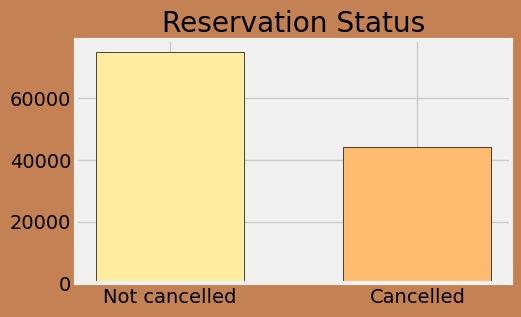

In [ ]:
cancelled_perc = df['is_canceled'].value_counts(normalize=True)
print(cancelled_perc)
colors = sns.color_palette(["#FFEC9E", "#FFBB70"])

plt.figure(figsize = (5,3),facecolor="#C38154")
plt.title('Reservation Status')
plt.bar(['Not cancelled' , 'Cancelled'],df['is_canceled'].value_counts(), edgecolor = 'k', width = 0.6,color=colors)
plt.show()

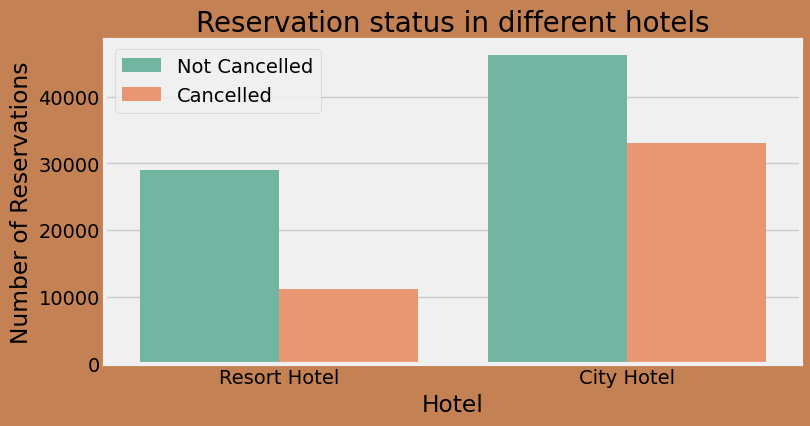

In [ ]:
plt.figure(figsize=(8, 4), facecolor='#C38154')
ax1 = sns.countplot(x='hotel', hue='is_canceled', data=df, palette="Set2")
legend_labels, _ = ax1.get_legend_handles_labels()
ax1.legend(bbox_to_anchor=(1, 1))
plt.title('Reservation status in different hotels', size=20, color='Black')
plt.xlabel('Hotel',color='Black')
plt.ylabel('Number of Reservations', color='Black')
plt.legend(['Not Cancelled', 'Cancelled'])
plt.show()

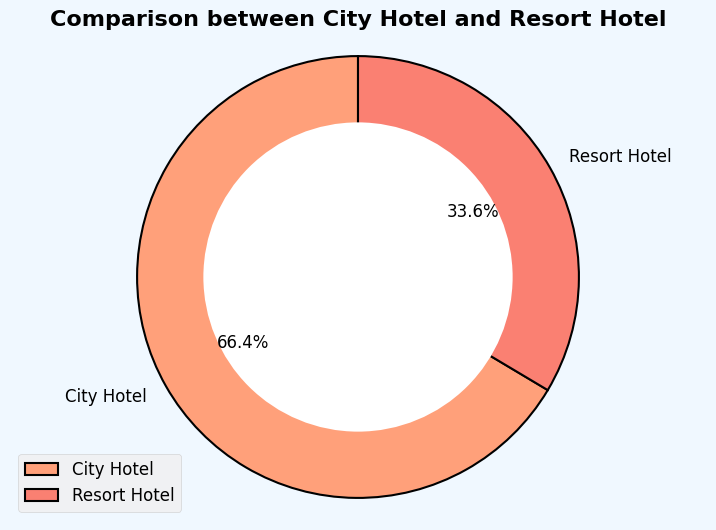

In [ ]:
hotel_type = df['hotel'].value_counts()
colors = ['#FFA07A', '#FA8072']
plt.figure(figsize=(8, 6), facecolor='#F0F8FF')
plt.pie(hotel_type, labels=hotel_type.index, autopct='%1.1f%%', colors=colors,
        startangle=90, wedgeprops={'edgecolor': 'black', 'linewidth': 1.5},
        textprops={'fontsize': 12})
plt.title('Comparison between City Hotel and Resort Hotel', fontsize=16, fontweight='bold')
plt.legend(loc='lower left', fontsize=12)
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.axis('equal')
plt.show()

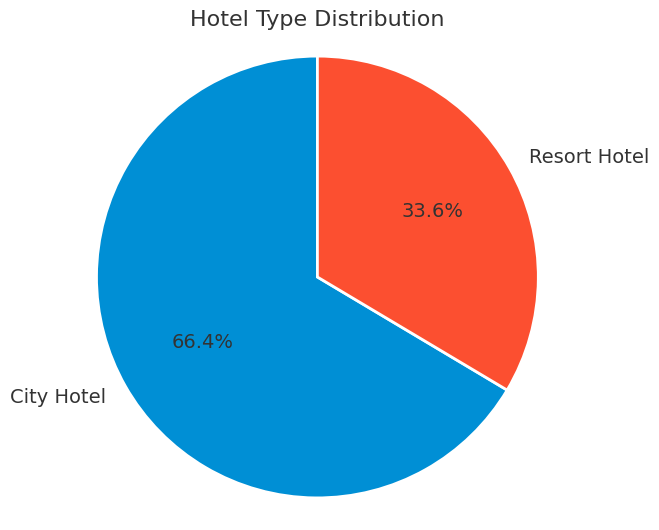

In [ ]:
hotel_type = df['hotel'].value_counts()

plt.figure(figsize=(6, 6), facecolor='white')
plt.pie(hotel_type, labels=hotel_type.index, autopct='%1.1f%%',
        startangle=90, wedgeprops={'edgecolor': 'white', 'linewidth': 2},
        textprops={'fontsize': 14, 'color': '#333333'})

plt.title('Hotel Type Distribution', fontsize=16, color='#333333')

plt.axis('equal')

plt.show()

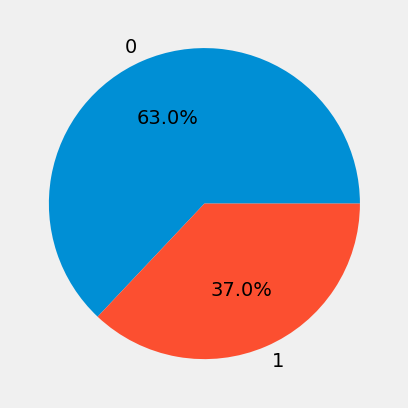

In [ ]:
df_is_canceled = df['is_canceled'].value_counts()
plt.pie(df_is_canceled, labels = df_is_canceled.index, autopct = "%1.1f%%")
plt.show()

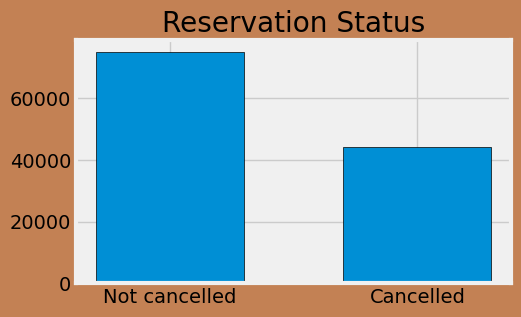

In [ ]:
plt.figure(figsize = (5,3),facecolor="#C38154")
plt.title('Reservation Status')
plt.bar(['Not cancelled' , 'Cancelled'],df['is_canceled'].value_counts(), edgecolor = 'k', width = 0.6,)
plt.show()

In [ ]:
df['customer_type'].value_counts()

,count
customer_type,
Transient,89612
Transient-Party,25124
Contract,4076
Group,577


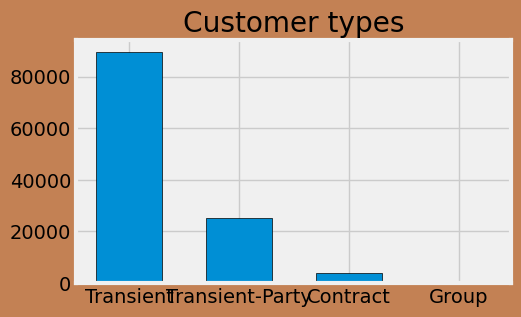

In [ ]:
df['customer_type'].value_counts()
plt.figure(figsize = (5,3),facecolor="#C38154")
plt.title('Customer types')
plt.bar(df['customer_type'].value_counts().index, df['customer_type'].value_counts(), edgecolor = 'k', width = 0.6,)
plt.show()

In [ ]:
resort_hotel= df[df['hotel']=='Resort Hotel']
resort_hotel['is_canceled'].value_counts(normalize = True)

,proportion
is_canceled,
0,0.722366
1,0.277634


In [ ]:
City_Hotel = df[df['hotel']== 'City Hotel']
City_Hotel['is_canceled'].value_counts(normalize =True)

,proportion
is_canceled,
0,0.582738
1,0.417262


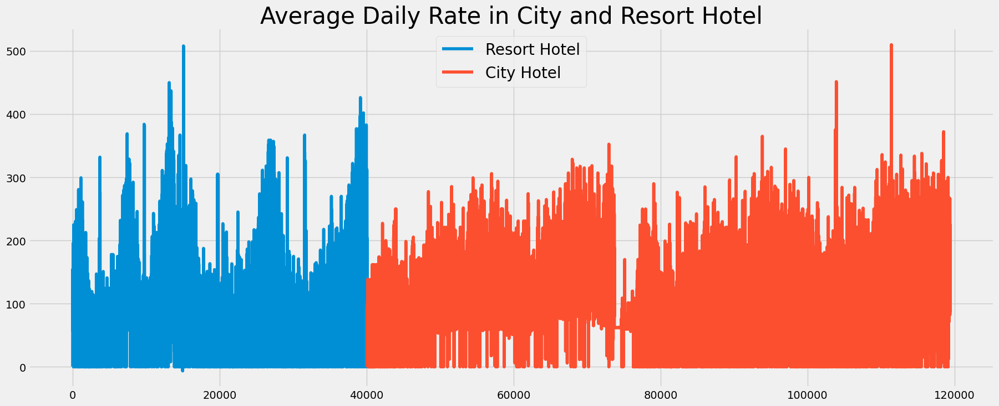

In [ ]:
plt.figure(figsize = (20,8))
plt.title('Average Daily Rate in City and Resort Hotel', fontsize=30)
plt.plot(resort_hotel.index, resort_hotel['adr'], label = 'Resort Hotel')
plt.plot(City_Hotel.index, City_Hotel['adr'], label = 'City Hotel')
plt.legend(fontsize = 20)
plt.show()

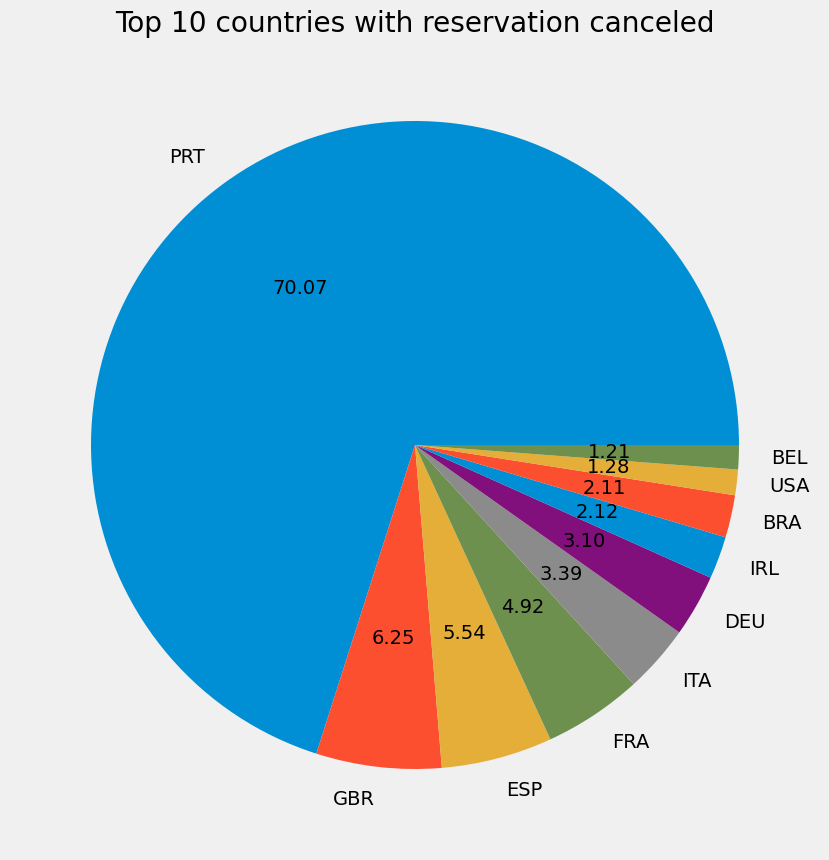

In [ ]:
cancelled_df = df[df['is_canceled'] == 1]
top_10_country = cancelled_df['country'].value_counts()[:10]
plt.figure(figsize=(10,10))
plt.title('Top 10 countries with reservation canceled')
plt.pie(top_10_country, autopct='%.2f',labels = top_10_country.index)
plt.show()

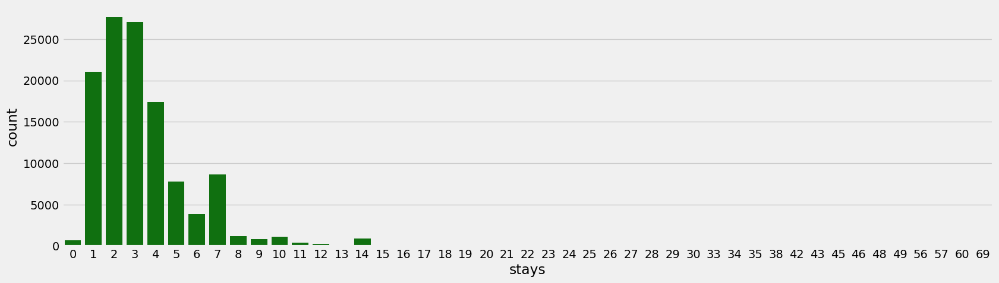

In [ ]:
df['stays']= df['stays_in_weekend_nights']+df['stays_in_week_nights']
plt.figure(figsize=(18,5))
sns.countplot(x=df['stays'], color='g')
plt.show()

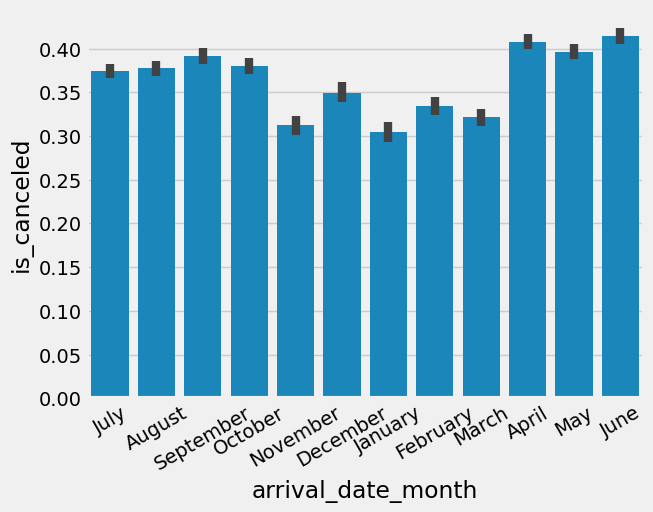

In [ ]:
sns.barplot(x='arrival_date_month', y='is_canceled', data=df)
plt.xticks(rotation = 30)
plt.show()

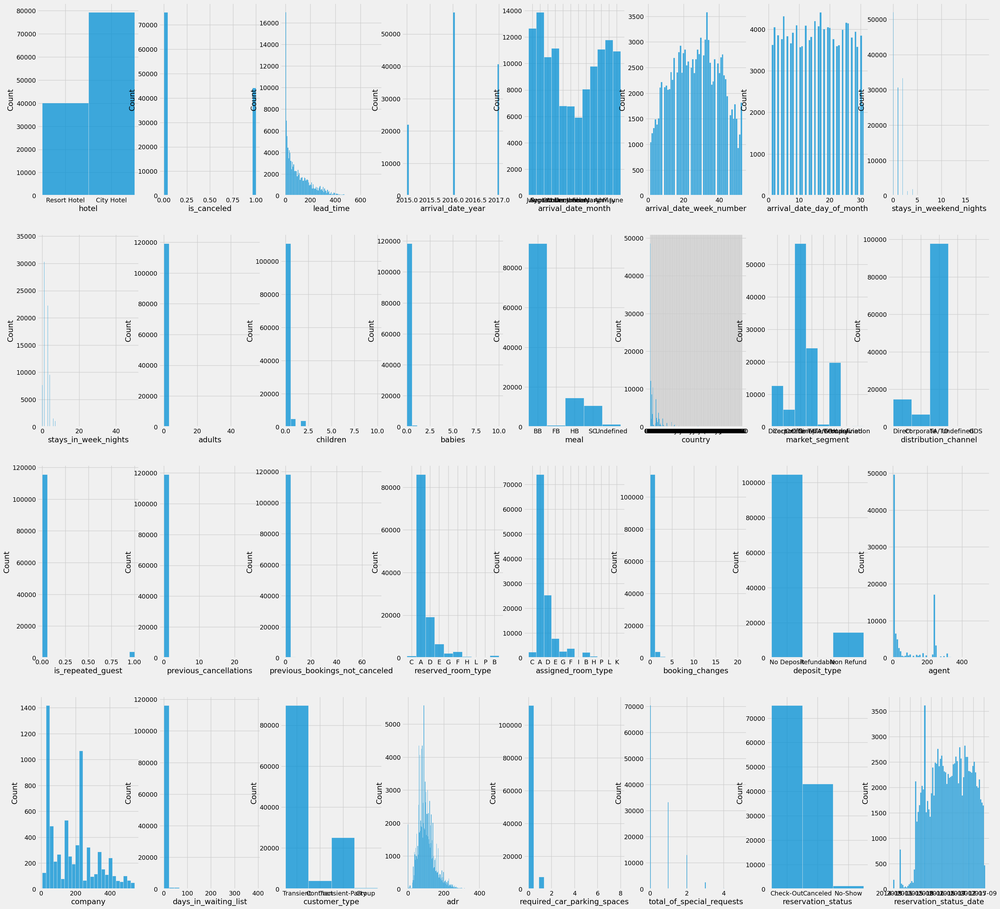

In [ ]:
plt.figure(figsize=(34,34))
i = 0
for col in df.columns:
  i = i + 1
  if i <= 32:
    plt.subplot(4,8,i)
    sns.histplot(data=df[col])

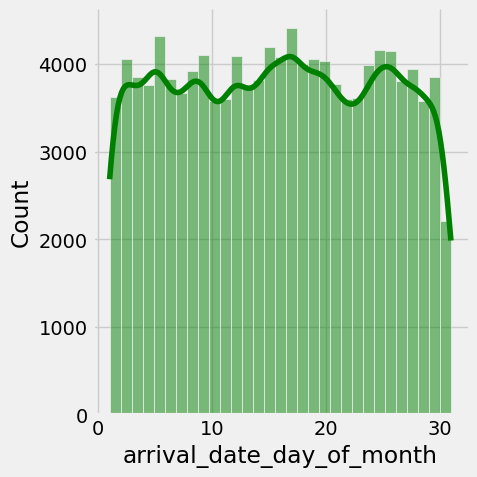

In [ ]:
sns.displot(data=df,x='arrival_date_day_of_month', bins=31 , kde=True, color='g')
plt.show()

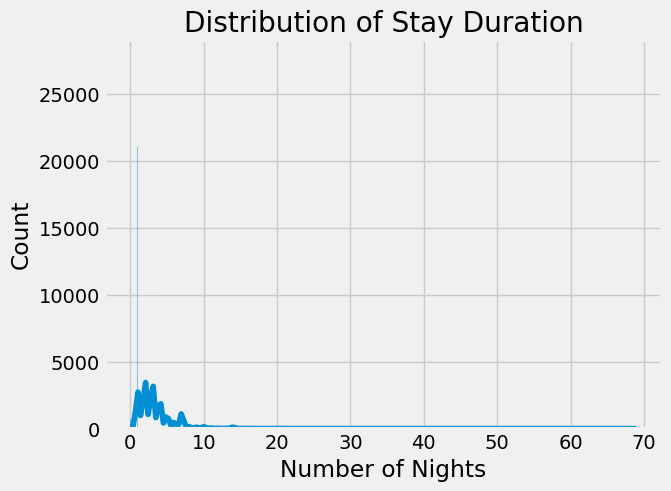

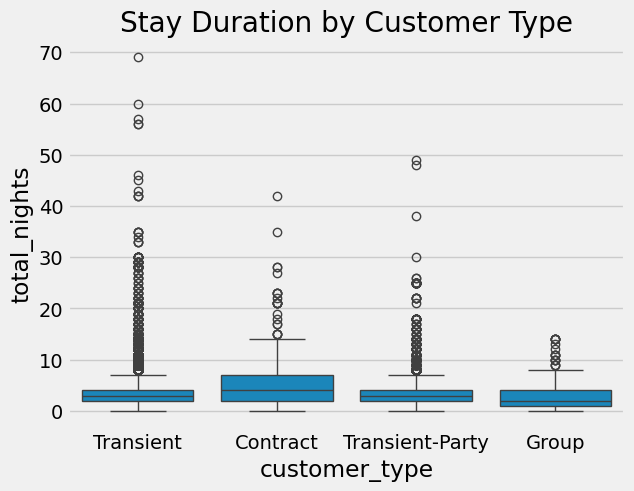

In [ ]:
df['total_nights'] = df['stays_in_weekend_nights'] + df['stays_in_week_nights']

sns.histplot(df['total_nights'], kde=True)
plt.title('Distribution of Stay Duration')
plt.xlabel('Number of Nights')
plt.ylabel('Count')
plt.show()

sns.boxplot(x='customer_type', y='total_nights', data=df)
plt.title('Stay Duration by Customer Type')
plt.show()

distribution_channel
TA/TO        81.974889
Direct       12.266624
Corporate     5.592643
GDS           0.161656
Undefined     0.004188
Name: proportion, dtype: float64


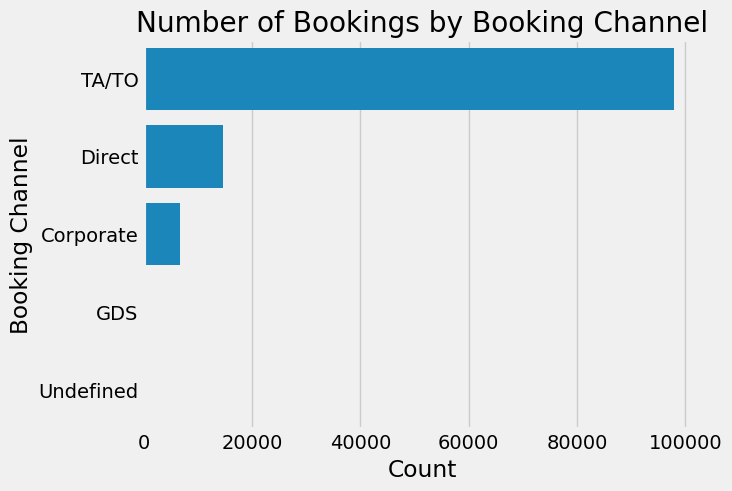

In [ ]:
channel_counts = df['distribution_channel'].value_counts(normalize=True) * 100
print(channel_counts)

sns.countplot(y='distribution_channel', data=df, order=df['distribution_channel'].value_counts().index)
plt.title('Number of Bookings by Booking Channel')
plt.xlabel('Count')
plt.ylabel('Booking Channel')
plt.show()

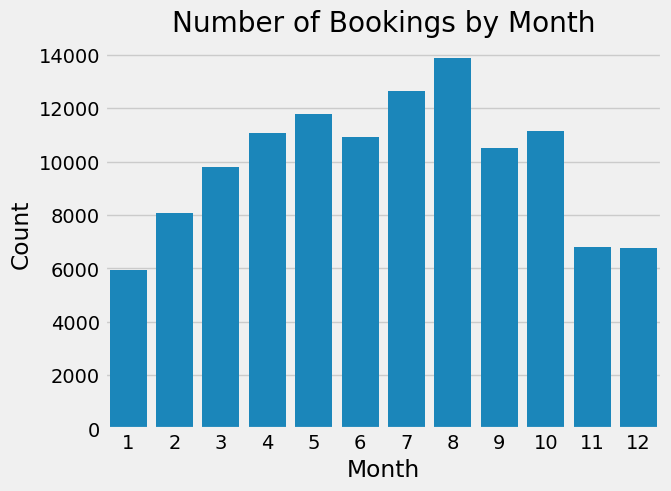

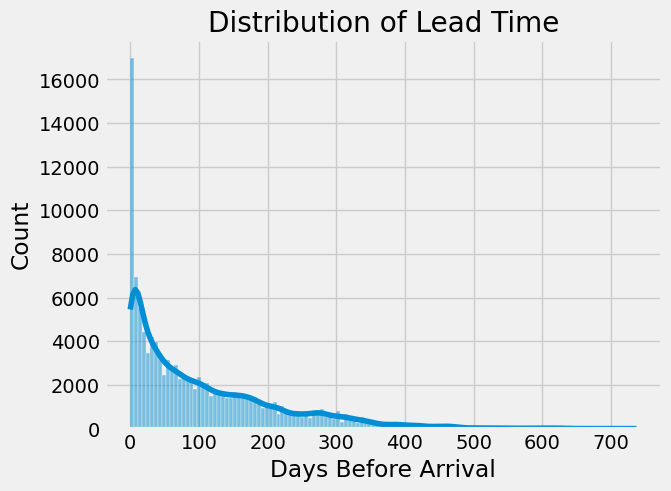

In [ ]:
df['arrival_date'] = pd.to_datetime(df['arrival_date_year'].astype(str) + '-' +
                                    df['arrival_date_month'] + '-' +
                                    df['arrival_date_day_of_month'].astype(str))

df['month'] = df['arrival_date'].dt.month
sns.countplot(x='month', data=df, order=range(1, 13))
plt.title('Number of Bookings by Month')
plt.xlabel('Month')
plt.ylabel('Count')
plt.show()

sns.histplot(df['lead_time'], kde=True)
plt.title('Distribution of Lead Time')
plt.xlabel('Days Before Arrival')
plt.ylabel('Count')
plt.show()

<Axes: xlabel='stays_in_weekend_nights', ylabel='stays_in_week_nights'>

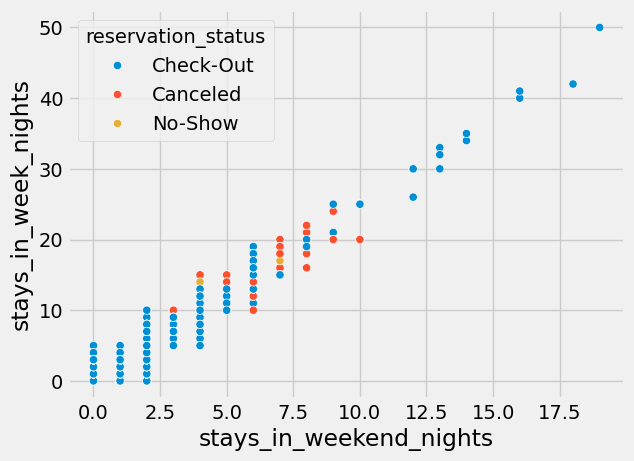

In [ ]:
sns.scatterplot(data=df, x='stays_in_weekend_nights', y='stays_in_week_nights', hue='reservation_status')

In [ ]:
fig = go.Figure(go.Histogram(
    x=df['lead_time'],
    nbinsx=50,
    marker_color='indianred'
))

fig.update_layout(
    title='Distribution of Lead Time',
    xaxis_title='Lead Time (days)',
    yaxis_title='Number of Bookings',
    bargap=0.1,
    width=800,
    height=500
)

fig.show()

In [ ]:
df['month'] = pd.to_datetime(df['arrival_date_month'], format='%B').dt.month
fig = px.bar(df,
             x='month',
             title='Number of Bookings by Month',
             labels={'month': 'Month', 'count': 'Number of Bookings'},
             width=800,
             height=500
             )
fig.update_traces(marker_color='#333333')
fig.update_layout(
    xaxis=dict(
        tickmode='array',
        tickvals=list(range(1, 13)),
        ticktext=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                  'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
    ),
    yaxis_title='Number of Bookings'
)
fig.show()

In [ ]:
fig = px.bar(
    df,
    x="customer_type",
    color="is_canceled",
    title="Booking Cancellations by Customer Type",
    labels={"is_canceled": "Canceled", "count": "Number of Bookings"},
    width=800,
    height=500,
)

fig.update_layout(
    yaxis_title="Number of Bookings",
    barmode="stack",
    xaxis={"categoryorder": "total descending"},
    template="plotly_dark",
)

fig.update_traces(marker_line_color='blue',
                  marker_line_width=2)

fig.show()

In [ ]:
fig = px.box(df, x='market_segment', y='adr',
             title='Average Daily Rate by Market Segment',
             labels={'adr': 'Average Daily Rate (ADR)', 'market_segment': 'Market Segment'},
             width=800, height=500)

fig.update_layout(
    xaxis_title='Market Segment',
    yaxis_title='Average Daily Rate (ADR)',
    xaxis={'categoryorder':'total descending'},
    template='plotly_dark'
)

fig.show()

In [ ]:
  fig = px.pie(df, names='distribution_channel',
             title='Distribution of Bookings by Channel',
             width=800, height=500,
             color_discrete_sequence=px.colors.qualitative.Vivid)

fig.update_layout(template='plotly_dark')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()


In [ ]:
count_country = df.groupby(by='country')['hotel'].count()
count_country = count_country.sort_values(ascending=False)
df_count_country = pd.DataFrame(count_country)

print("The most travelers come from:\n ",count_country[:1])

print("\nList the 5 countries with the most passengers.\n",count_country[:5])

The most travelers come from:
  country
PRT    48589
Name: hotel, dtype: int64

List the 5 countries with the most passengers.
 country
PRT    48589
GBR    12129
FRA    10415
ESP     8568
DEU     7287
Name: hotel, dtype: int64


In [ ]:
df.loc[df['total_of_special_requests'] == 5]

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,...,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,stays,total_nights,arrival_date,month
7860,Resort Hotel,1,39,2016,August,36,30,0,5,2,0.0,0,HB,NaN,Direct,Direct,...,A,0,No Deposit,NaN,NaN,0,Transient,159.00,0,5,Canceled,2016-07-22,5,5,2016-08-30,8
11125,Resort Hotel,0,108,2017,April,16,21,4,7,2,0.0,0,BB,PRT,Online TA,Direct,...,E,2,No Deposit,NaN,NaN,0,Transient,85.00,0,5,Check-Out,2017-05-02,11,11,2017-04-21,4
14596,Resort Hotel,0,22,2015,July,28,9,0,3,3,0.0,0,HB,NaN,Direct,Direct,...,E,1,No Deposit,NaN,NaN,0,Transient-Party,180.67,1,5,Check-Out,2015-07-12,3,3,2015-07-09,7
14921,Resort Hotel,0,185,2017,February,8,24,2,2,1,0.0,0,BB,PRT,Online TA,Direct,...,A,2,No Deposit,NaN,NaN,0,Transient,39.60,0,5,Check-Out,2017-02-28,4,4,2017-02-24,2
14922,Resort Hotel,0,134,2017,April,15,13,0,3,1,0.0,0,BB,PRT,Online TA,Direct,...,A,0,No Deposit,NaN,NaN,0,Transient,61.50,0,5,Check-Out,2017-04-16,3,3,2017-04-13,4
24630,Resort Hotel,0,76,2016,May,21,20,2,5,2,2.0,0,BB,GBR,Online TA,TA/TO,...,G,0,No Deposit,240.0,NaN,0,Transient-Party,127.14,0,5,Check-Out,2016-05-27,7,7,2016-05-20,5
27288,Resort Hotel,0,210,2016,August,33,12,4,10,2,0.0,0,BB,GBR,Offline TA/TO,TA/TO,...,D,0,No Deposit,2.0,NaN,0,Contract,106.55,0,5,Check-Out,2016-08-26,14,14,2016-08-12,8
27477,Resort Hotel,0,3,2016,August,35,24,2,5,2,0.0,0,BB,GBR,Online TA,TA/TO,...,D,0,No Deposit,240.0,NaN,0,Transient,198.86,0,5,Check-Out,2016-08-31,7,7,2016-08-24,8
29906,Resort Hotel,0,47,2016,November,45,5,2,2,2,0.0,2,HB,GBR,Online TA,TA/TO,...,C,1,No Deposit,240.0,NaN,0,Transient,74.80,0,5,Check-Out,2016-11-09,4,4,2016-11-05,11
29949,Resort Hotel,0,24,2017,March,13,29,0,2,2,0.0,0,BB,BRA,Direct,TA/TO,...,D,0,No Deposit,250.0,NaN,0,Group,63.00,0,5,Check-Out,2017-03-31,2,2,2017-03-29,3


In [ ]:
df["country"].value_counts(sort=True)[:5]

,count
country,
PRT,48589
GBR,12129
FRA,10415
ESP,8568
DEU,7287


In [ ]:
for col in df.describe(include='object').columns:
    print(col)
    print(df[col].unique())
    print('-'*50)

hotel
['Resort Hotel' 'City Hotel']
--------------------------------------------------
arrival_date_month
['July' 'August' 'September' 'October' 'November' 'December' 'January'
 'February' 'March' 'April' 'May' 'June']
--------------------------------------------------
meal
['BB' 'FB' 'HB' 'SC' 'Undefined']
--------------------------------------------------
country
['PRT' 'GBR' 'USA' 'ESP' 'IRL' 'FRA' nan 'ROU' 'NOR' 'OMN' 'ARG' 'POL'
 'DEU' 'BEL' 'CHE' 'CN' 'GRC' 'ITA' 'NLD' 'DNK' 'RUS' 'SWE' 'AUS' 'EST'
 'CZE' 'BRA' 'FIN' 'MOZ' 'BWA' 'LUX' 'SVN' 'ALB' 'IND' 'CHN' 'MEX' 'MAR'
 'UKR' 'SMR' 'LVA' 'PRI' 'SRB' 'CHL' 'AUT' 'BLR' 'LTU' 'TUR' 'ZAF' 'AGO'
 'ISR' 'CYM' 'ZMB' 'CPV' 'ZWE' 'DZA' 'KOR' 'CRI' 'HUN' 'ARE' 'TUN' 'JAM'
 'HRV' 'HKG' 'IRN' 'GEO' 'AND' 'GIB' 'URY' 'JEY' 'CAF' 'CYP' 'COL' 'GGY'
 'KWT' 'NGA' 'MDV' 'VEN' 'SVK' 'FJI' 'KAZ' 'PAK' 'IDN' 'LBN' 'PHL' 'SEN'
 'SYC' 'AZE' 'BHR' 'NZL' 'THA' 'DOM' 'MKD' 'MYS' 'ARM' 'JPN' 'LKA' 'CUB'
 'CMR' 'BIH' 'MUS' 'COM' 'SUR' 'UGA' 'BGR' 'CIV' 'J

In [ ]:
country_wise_guests = df.groupby('country')['hotel'].count().reset_index(name='No of guests')

basemap = folium.Map()
guests_map = px.choropleth(country_wise_guests,
                           locations = country_wise_guests['country'],
                           color = country_wise_guests['No of guests'],
                           hover_name = country_wise_guests['country'])
guests_map.show()

In [ ]:
df.describe()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests,reservation_status_date,stays,total_nights,arrival_date,month
count,119389.000000,119389.000000,119389.000000,119389.000000,119389.000000,119389.000000,119389.000000,119389.000000,119385.000000,119389.000000,119389.000000,119389.000000,119389.000000,119389.000000,103049.000000,6797.000000,119389.000000,119389.000000,119389.000000,119389.000000,119389,119389.00000,119389.00000,119389,119389.000000
mean,0.370411,104.011994,2016.156555,27.165292,15.798164,0.927606,2.500314,1.856402,0.103891,0.007949,0.031912,0.087119,0.137098,0.221118,86.694107,189.266735,2.321169,101.786744,0.062518,0.571368,2016-07-30 00:26:45.132801280,3.42792,3.42792,2016-08-28 16:41:39.124709632,6.552513
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,0.000000,-6.380000,0.000000,0.000000,2014-10-17 00:00:00,0.00000,0.00000,2015-07-01 00:00:00,1.000000
25%,0.000000,18.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,62.000000,0.000000,69.290000,0.000000,0.000000,2016-02-01 00:00:00,2.00000,2.00000,2016-03-13 00:00:00,4.000000
50%,0.000000,69.000000,2016.000000,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,179.000000,0.000000,94.560000,0.000000,0.000000,2016-08-07 00:00:00,3.00000,3.00000,2016-09-06 00:00:00,7.000000
75%,1.000000,160.000000,2017.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,229.000000,270.000000,0.000000,126.000000,0.000000,1.000000,2017-02-08 00:00:00,4.00000,4.00000,2017-03-18 00:00:00,9.000000
max,1.000000,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,1.000000,26.000000,72.000000,21.000000,535.000000,543.000000,391.000000,510.000000,8.000000,5.000000,2017-09-14 00:00:00,69.00000,69.00000,2017-08-31 00:00:00,12.000000
std,0.482917,106.863358,0.707479,13.605134,8.780826,0.998614,1.908289,0.579263,0.398563,0.097437,0.175768,0.844340,1.497443,0.652304,110.774841,131.655015,17.594793,48.153554,0.245292,0.792800,NaN,2.55744,2.55744,NaN,3.090615
